![header](../figures/logos_partenaires._cmems_se.jpg)

# Intercomparison of sea surface gridded product

<div style="text-align: right"><i> 2023-04-27 INTERCOMPARISON_DEMO </i></div>

***
**Authors:**  CLS & Datlas <br>
**Copyright:** 2023 CLS & Datlas <br>
**License:** MIT

<div class="alert alert-block alert-success">
<h1><center> Intercomparison of sea surface height maps</center></h1>
    
</div>

In [1]:
import sys
sys.path.append('..')
from src.mod_plot import *
from src.mod_compare import *
from src.mod_traj import *

In [2]:
output_dir = '../results' 
lon_min = -6
lon_max = 36
lat_min = 30
lat_max = 46 

In [8]:
data_path = '../data/maps/'
methods = ['DUACS-allsat','MIOST','4DVarNet']

ds_maps_list = list()

for method in methods: 
    print(method)
    files = data_path+method+'/*nc'
    ds_maps = xr.open_mfdataset(files,concat_dim='time', combine='nested')
    ds_maps = regional_zoom(ds_maps, [lon_min,lon_max], [lat_min,lat_max], namelon='longitude', namelat='latitude', change_lon=False)
    ds_maps = ds_maps.assign(uv=lambda ds_maps: 0.5*(ds_maps.ugos**2 + ds_maps.vgos**2))
    ds_maps_list.append(ds_maps)



DUACS-allsat
MIOST
4DVarNet



<div class="alert alert-block alert-success">
<h1><center> Sea Level Anomaly</center></h1>
    
</div>

<div class="alert alert-info" role="alert">

<h2>1. Movies</h2>

</div>

In [6]:
movie_intercomp(ds_maps_list, methods, name_var='sla', dir_output=output_dir,
                    region='4DMedSea', vmin=-0.5, vmax=0.5, cmap='RdBu_r' framerate=24, colsize = 30)

<div class="alert alert-info" role="alert">

<h2>2. Stat maps</h2>

</div>

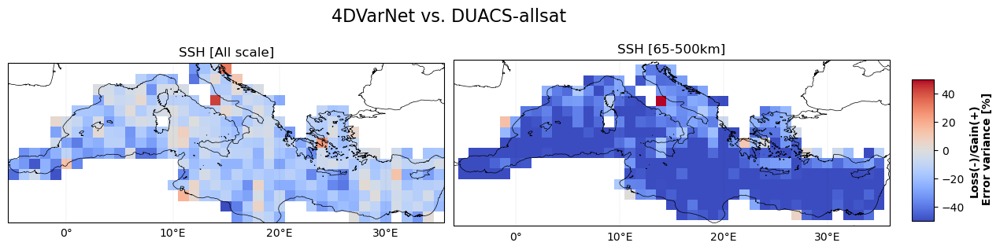

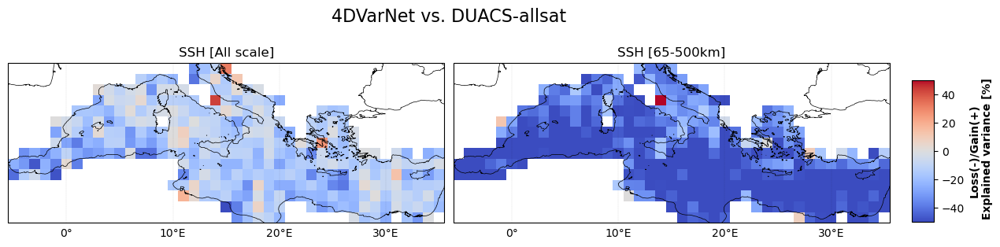

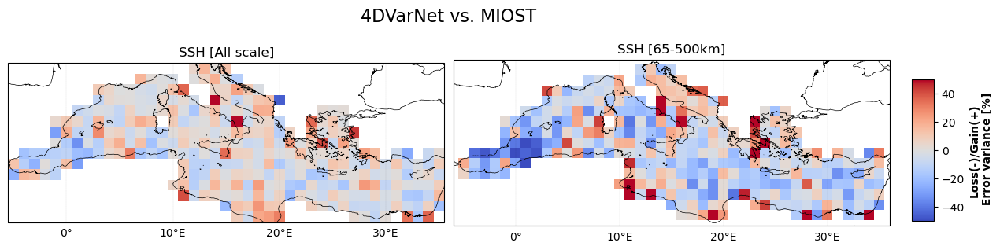

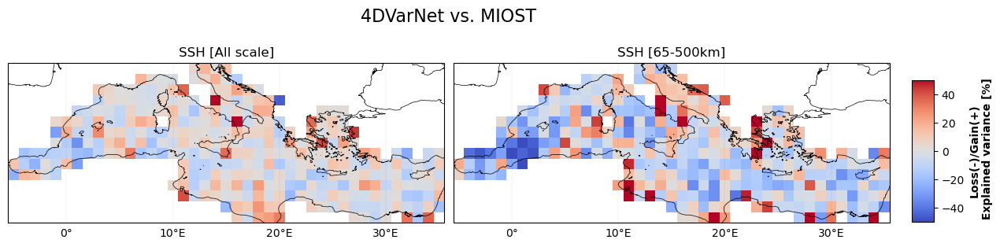

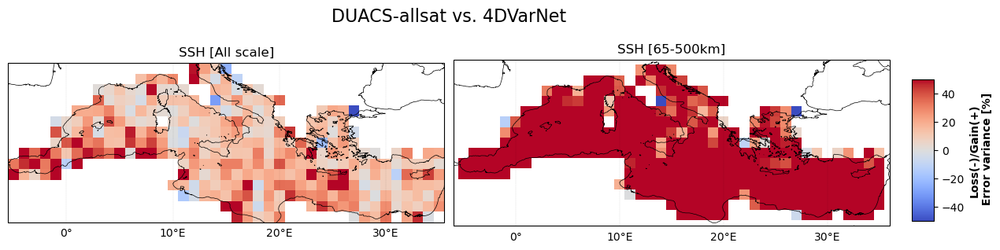

...

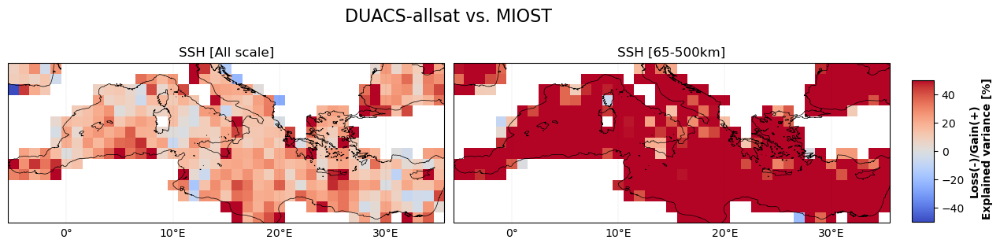

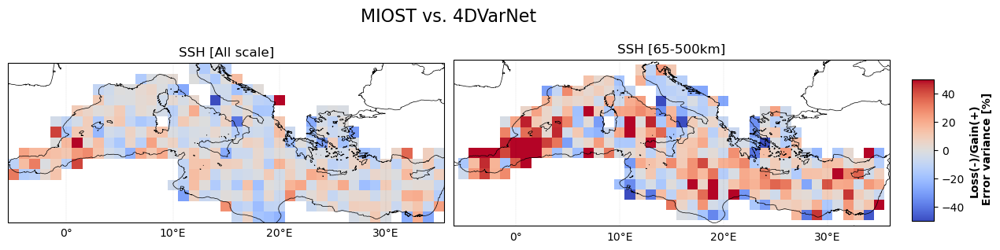

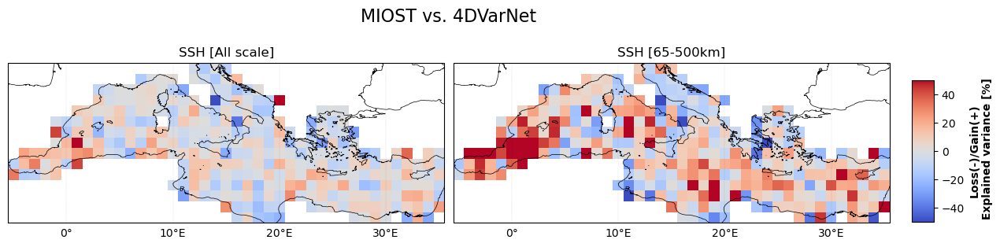

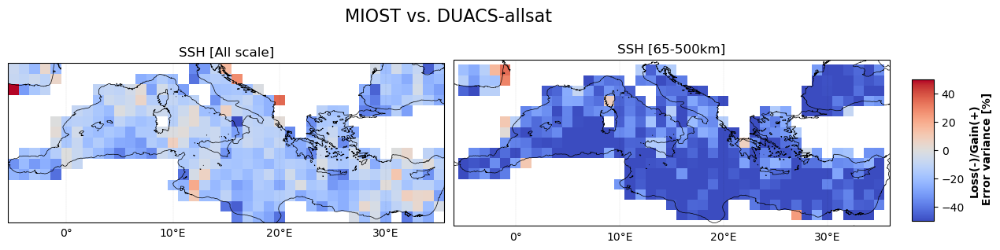

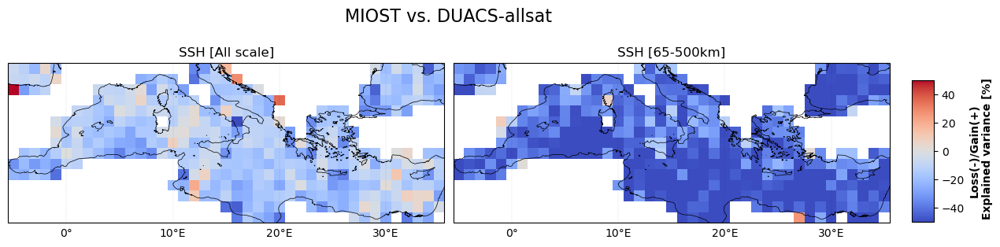

In [3]:
# Plot gridded stats
compare_stat_score_map_png(output_dir=output_dir, boxlon=[lon_min,lon_max], boxlat=[lat_min,lat_max], var_type='sla')

<div class="alert alert-info" role="alert">

<h2>3. Temporal stats</h2>

</div>

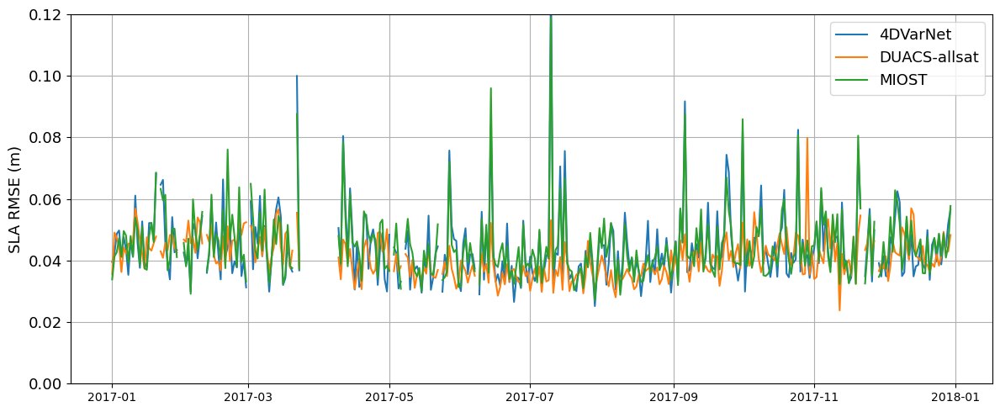

In [17]:
plot_temporal_rmse()

<div class="alert alert-info" role="alert">

<h2>4. Spectral maps</h2>

</div>

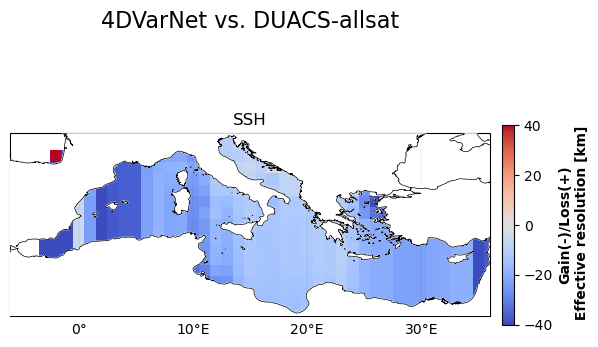

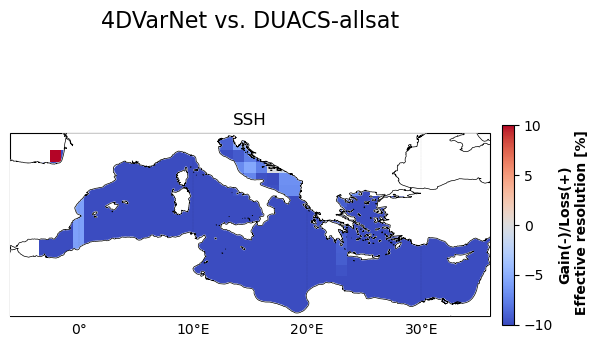

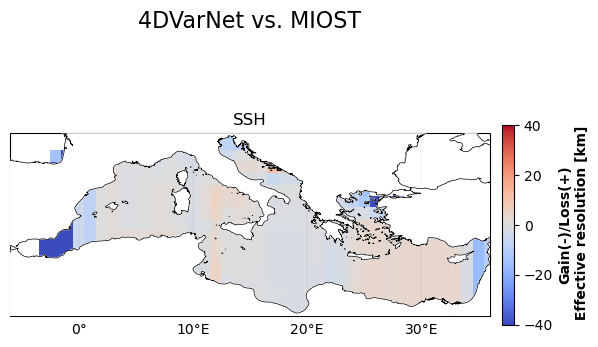

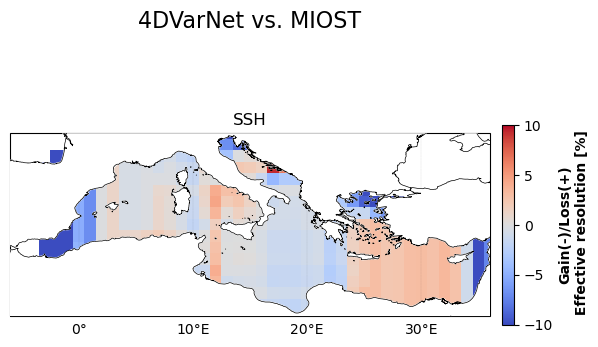

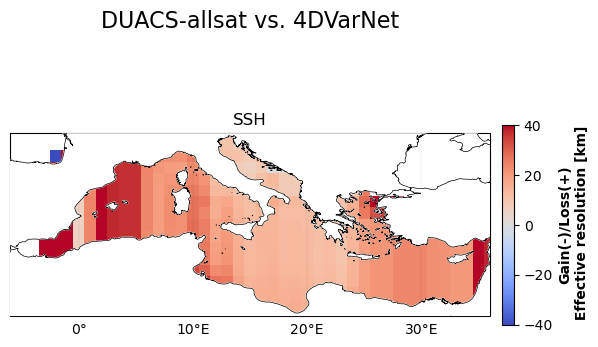

...

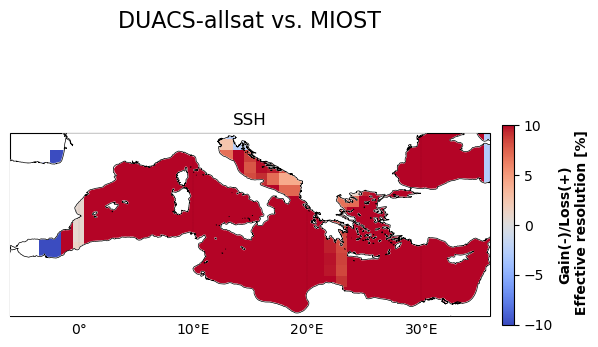

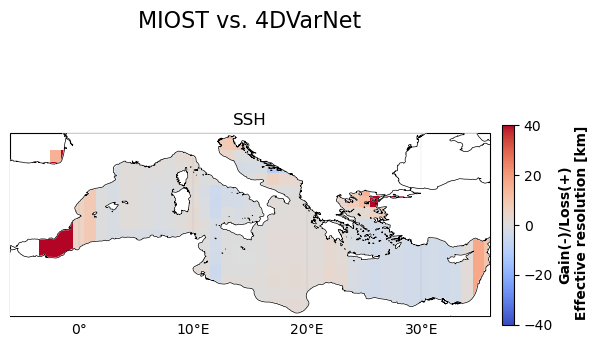

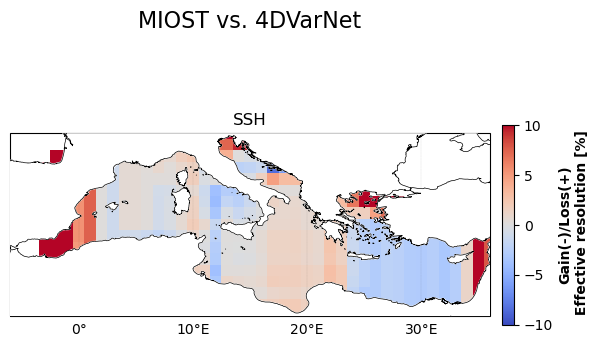

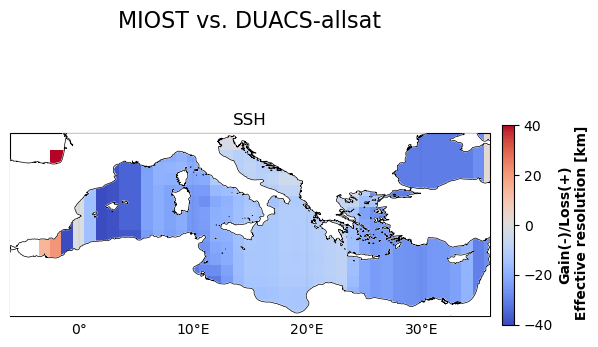

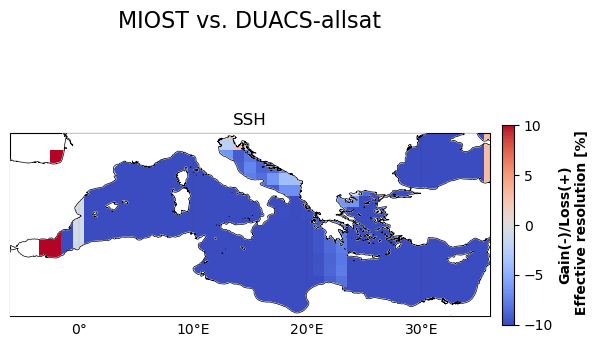

In [24]:
#compare_psd_score(miost_geos_psd_filename, duacs_geos_psd_filename)
compare_psd_score_png(output_dir=output_dir, boxlon=[lon_min,lon_max], boxlat=[lat_min,lat_max], var_type='sla')

<div class="alert alert-info" role="alert">

<h2>5. Spectral alongtrack</h2>

</div>

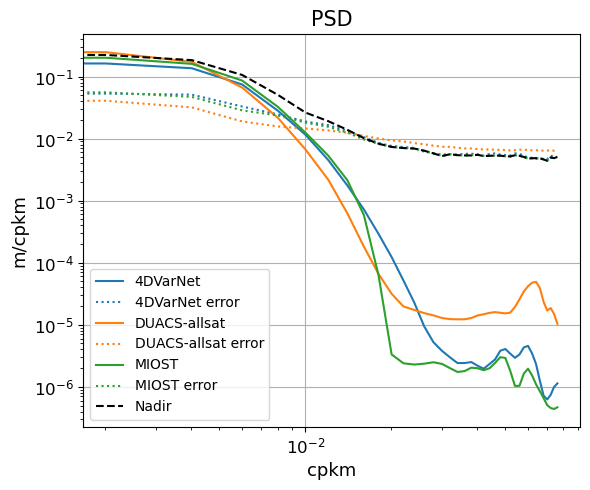

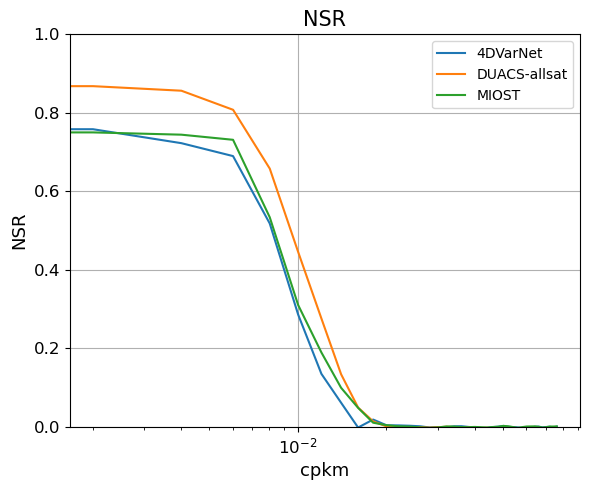

In [21]:
plot_average_psd()


<div class="alert alert-block alert-success">
<h1><center> Sea Surface Currents </center></h1>
    
</div>

<div class="alert alert-info" role="alert">

<h2>1. Movies</h2>

</div>

In [15]:
movie_intercomp(ds_maps_list, methods, name_var='uv', dir_output=output_dir,
                    region='4DMedSea', vmin=0., vmax=0.4, cmap='YlGnBu_r', framerate=24, colsize = 30)

<div class="alert alert-info" role="alert">

<h2>2. Stat maps</h2>

</div>

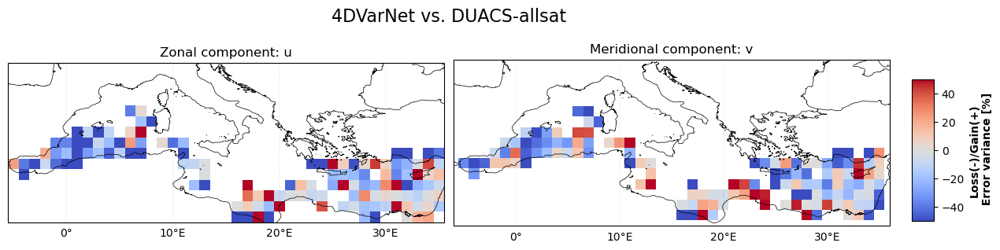

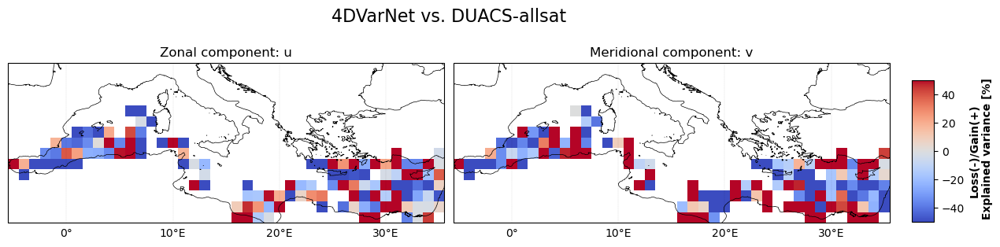

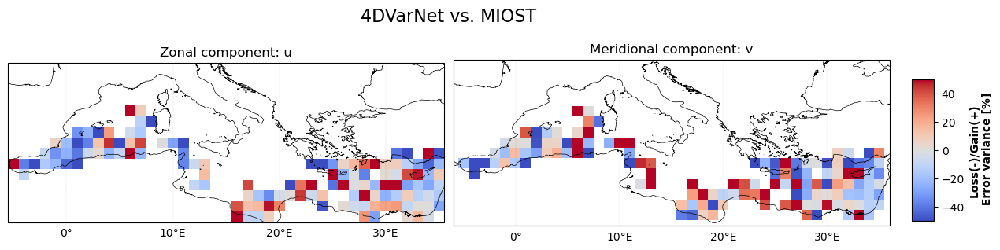

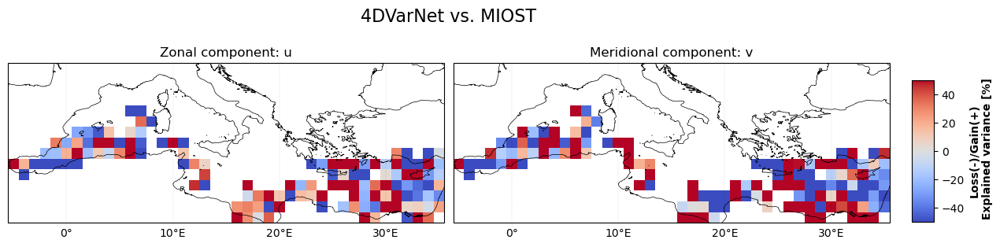

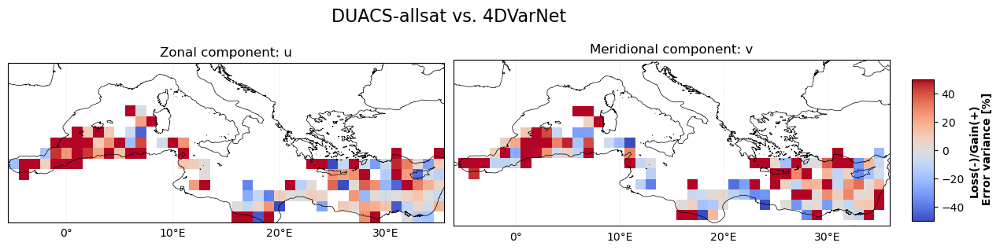

...

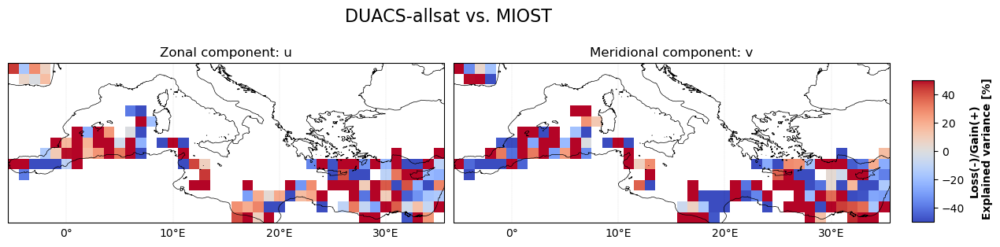

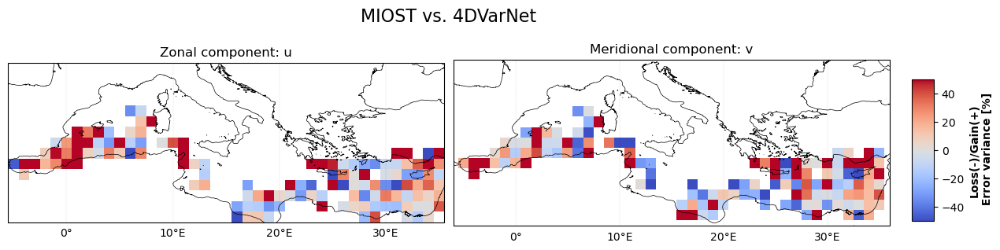

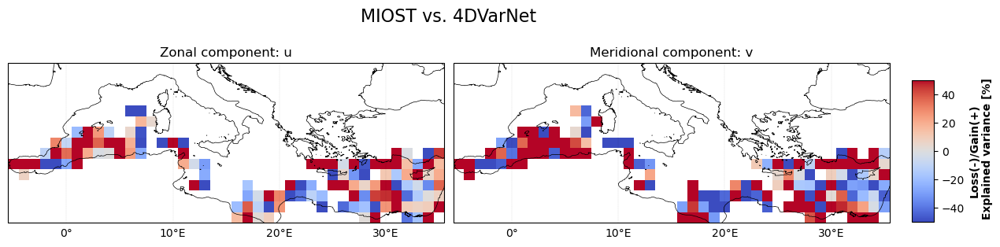

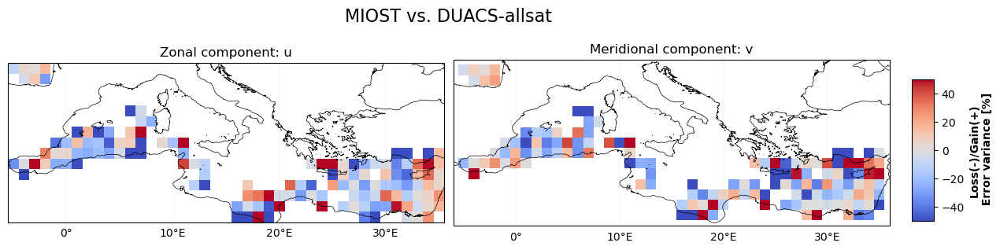

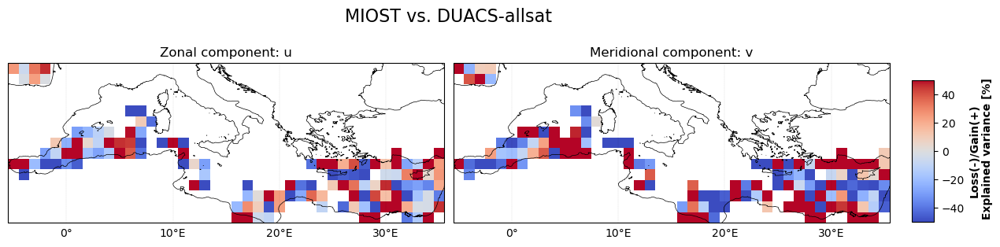

In [3]:
# Plot gridded stats
compare_stat_score_map_png(output_dir=output_dir, boxlon=[lon_min,lon_max], boxlat=[lat_min,lat_max], var_type='uv')

<div class="alert alert-info" role="alert">

<h2>3. Temporal stats</h2>

</div>

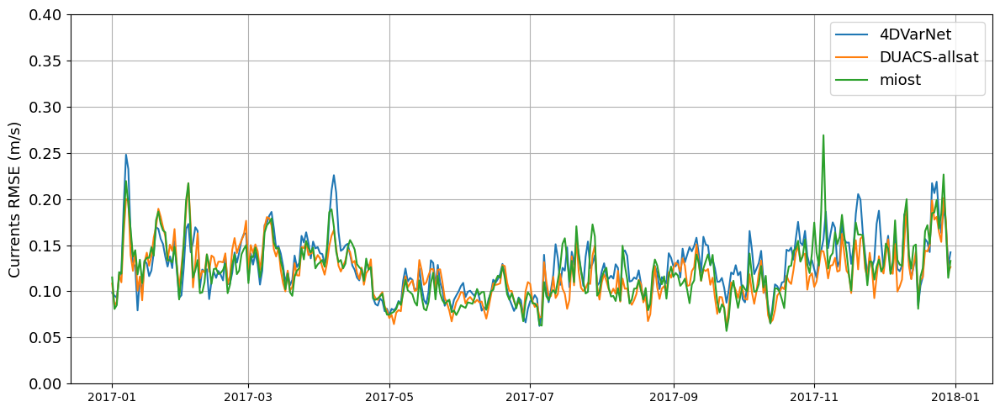

In [23]:
plot_temporal_rmse(var_type='uv')

## Plot spatially averaged deviation as a function of horizons

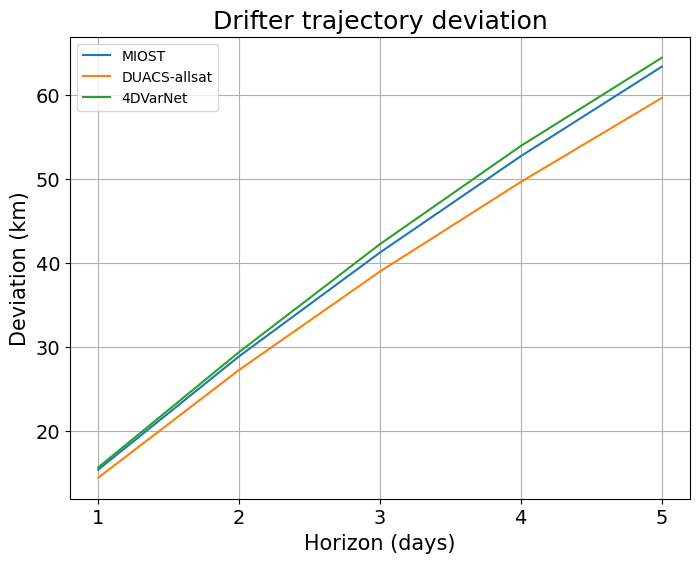

In [25]:
plot_meantraj_deviation()